# Validate DINOv3 CHM with airborne lidar grids (LVIS): plots `maps`

#### Read in large CSV and plot LVIS validation results - this is done on the `dm_10m` version of the results

#### Note: works in `ILAB Kernel (R) 2026` - but in `ILAB Kernel (R) v2026 (with tidyterra)` --> problem with getting crs() of dm 10m CHM

Paul Montesano  
Jan 2026

In [1]:
library(dplyr)
library(data.table)
library(tidyr)
library(ggplot2)
library(stringr)
library(terra)
library(patchwork)
library(scales)
library(ggspatial)

Warning message:
“package ‘dplyr’ was built under R version 4.4.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message:
“package ‘data.table’ was built under R version 4.4.3”

Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


Warning message:
“package ‘tidyr’ was built under R version 4.4.3”
Warning message:
“package ‘ggplot2’ was built under R version 4.4.3”
Warning message:
“package ‘stringr’ was built under R version 4.4.3”
terra 1.7.78


Attaching package: ‘terra’


The following object is masked from ‘package:tidyr’:

    extract


The following object is masked from ‘package:data.table’:

    shift


Warning message:
“package ‘patchwork’ was built under R version 4.4.3”

Attaching package: ‘patchwork’


The following object is masked from ‘package:terr

In [2]:
OUT_RESULTS_DIR = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/paper_figs" # validation/chm/dinov3/4.3.2.5/dm_10m/plots"

In [3]:
CSV_SET = 'LVISRH085_RH090_RH098'
CSV_SET = 'LVISRH075_RH085_RH098'

# Map

In [4]:
source('/home/pmontesa/code/above-shrubs/notebooks/validate_chm_dinov3_functions.r')

In [5]:
# Usage example:
val_csv_dir <- "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098"
lvis_grid_dir <- "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30"

# Get LVIS mosaic for a catid
lvis_mosaic <- get_lvis_mosaic_for_catid(
  catid = "1030010019B16500",
  val_csv_dir = val_csv_dir,
  lvis_grid_dir = lvis_grid_dir,
    LVIS_RH_STR = 'RH075',
  verbose = TRUE
)


=== LVIS  RH075  Mosaic Creation ===
Searching for catid: 1030010019B16500 in /explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098 
Found 4 validation CSV files
Found 4 unique LVIS flightlines:
   LVISF2_ABoVE2019_0727_R2003_066039 
   LVISF2_ABoVE2019_0727_R2003_066255 
   LVISF2_ABoVE2019_0728_R2003_060538 
   LVISF2_ABoVE2019_0728_R2003_061718 
Found LVIS  RH075  grid: LVISF2_ABoVE2019_0727_R2003_066039_RH075_mean_30m.tif 
Found LVIS  RH075  grid: LVISF2_ABoVE2019_0727_R2003_066255_RH075_mean_30m.tif 
Found LVIS  RH075  grid: LVISF2_ABoVE2019_0728_R2003_060538_RH075_mean_30m.tif 
Found LVIS  RH075  grid: LVISF2_ABoVE2019_0728_R2003_061718_RH075_mean_30m.tif 
Loading 4 LVIS  RH075  grid(s)...
Creating mosaic from 4 grids...
Mosaic created
Mosaic dimensions: 1380 4801 
Mosaic extent: -2756520 -2612490 4295150 4336550 
Mosaic CRS: unnamed 
LVIS mosaic ready



Linking to GEOS 3.12.2, GDAL 3.9.1, PROJ 9.4.1; sf_use_s2() is TRUE




=== CHM Processing ===
Searching for catid: 104001004F54B700 in /explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m 
Using CHM file: WV03_20190817_M1BS_104001004F54B700-chm-dm-10m.tif 
CHM CRS: NAD83 / Alaska Albers 
CHM dimensions: 9197 3618 
Applying crop with buffer: 500 x 500 pixels
Display extent: -417715.2 -412715.2 1635433 1640433 
Crop extent (with buffer): -418090.2 -412340.2 1635058 1640808 
Cropped CHM dimensions: 575 575 
CHM extent: -418095, -412345, 1635055, 1640805 

=== Source Processing ===
Searching for catid: 104001004F54B700 in /explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023 
Using source file: WV03_20190817_M1BS_104001004F54B700-sr-02m.tif 
Loading source raster...
Source CRS: WGS 84 / UTM zone 3N 
Source dimensions: 44767 10785 
Source bands: 8 
Source and CHM in same CRS: FALSE 
Cropping source to buffered CHM extent...
CHM extent in source CRS: 609230 615861 7147035 7153655 
Reprojecting cropped source to CHM CRS..

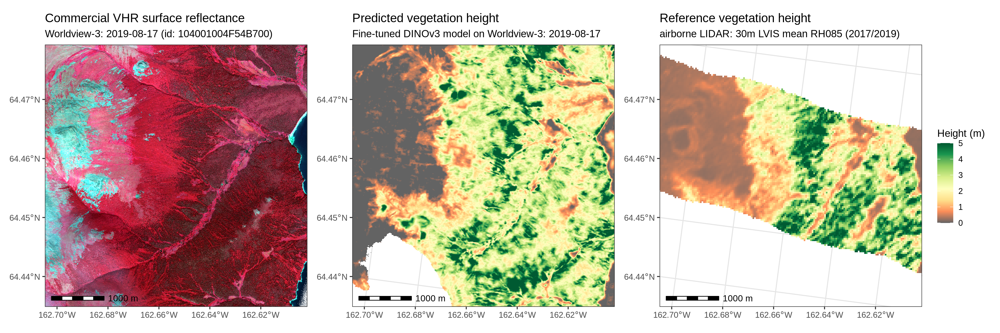

In [6]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# With LVIS reference
p_show_ref_104001004F54B700 <- map_raster_by_catid(
  catid = '104001004F54B700',#'1030010019B16500',
  chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
  source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
  val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
  lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
  lvis_rh_str = 'RH085',
  use_forest_ht_cmap = TRUE,
  fill_label = "Height (m)",
  crop_center_lon = -162.66,
  crop_center_lat = 64.46,
  crop_width_pixels = 500,
  crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_104001004F54B700)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# With LVIS reference
p_show_ref_104001004FBF8F00 <- map_raster_by_catid(
  catid = "104001004FBF8F00",
  chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
  source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
  val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
  lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
    lvis_rh_str = 'RH085',
  use_forest_ht_cmap = TRUE,
  fill_label = "Height (m)",
  crop_center_lon = -146.005,
  crop_center_lat = 66.5,
  crop_width_pixels = 500,
  crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_104001004FBF8F00)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# With LVIS reference
p_show_ref_103001006E5C5200 <- map_raster_by_catid(
  catid = "103001006E5C5200",
  chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
  source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
  val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
  lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
    lvis_rh_str = 'RH085',
  use_forest_ht_cmap = TRUE,
  fill_label = "Height (m)",
  crop_center_lon = -164.1443,
  crop_center_lat = 65.4084,
  crop_width_pixels = 500,
  crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_103001006E5C5200)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# With LVIS reference
p_show_ref_103001006E5C5200 <- map_raster_by_catid(
  catid = "103001006E5C5200",
  chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
  source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
  val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
  lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
    lvis_rh_str = 'RH085',
  use_forest_ht_cmap = TRUE,
  fill_label = "Height (m)",
  crop_center_lon = -164.1443,
  crop_center_lat = 65.4084,
  crop_width_pixels = 200,
  crop_height_pixels = 200,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_103001006E5C5200)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_10300100255A5800 <- map_raster_by_catid(
    catid = "10300100255A5800",
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -151.31089,
    crop_center_lat = 67.09989,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_10300100255A5800)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_10300100255A5800 <- map_raster_by_catid(
    catid = "10300100255A5800",
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -151.31089,
    crop_center_lat = 67.09989,
    crop_width_pixels = 200,
    crop_height_pixels = 200,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_10300100255A5800)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_10300100263C5F00 <- map_raster_by_catid(
    catid = "10300100263C5F00",
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -153.20882,
    crop_center_lat = 66.70493,
    crop_width_pixels = 200,
    crop_height_pixels = 200,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_10300100263C5F00)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_103001002686A600 <- map_raster_by_catid(
    catid = "103001002686A600",
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -161.31563,
    crop_center_lat = 67.98,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_103001002686A600)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_10300100066AFE00 <- map_raster_by_catid(
    catid = "10300100066AFE00",
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -157.95727,
    crop_center_lat = 66.07986,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_10300100066AFE00)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_10300100066AFE00 <- map_raster_by_catid(
    catid = "10300100066AFE00",
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -157.70492,
    crop_center_lat = 66.06681,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_10300100066AFE00)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_10300100233EDD00 <- map_raster_by_catid(
    catid = "10300100233EDD00",
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -161.2515,
    crop_center_lat = 62.6380,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_10300100233EDD00)

#### [NOT USEFUL]

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# With LVIS reference
p_show_ref_10300100A70F3B00 <- map_raster_by_catid(
  catid = "10300100A70F3B00",
  chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
  source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
  val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
  lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
  use_forest_ht_cmap = TRUE,
  fill_label = "Height (m)",
  crop_center_lon = -158.1120,
  crop_center_lat = 65.4456,
  crop_width_pixels = 500,
  crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)
print(p_show_ref_10300100A70F3B00)

#### Map a bad catid? [NOT NEEDED]

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# Custom CHM max = 20
p_bad_103001000C00E300 <- map_raster_by_catid( 
    catid = "103001000C00E300", 
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -148.7,
    crop_center_lat = 63.22,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)  # Crop 15% larger, display smaller

print(p_bad_103001000C00E300)


=== CHM Processing ===
Searching for catid: 1030010019B16500 in /explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m 
Using CHM file: WV02_20120706_M1BS_1030010019B16500-chm-dm-10m.tif 
CHM CRS: NAD83 / Alaska Albers 
CHM dimensions: 7965 3164 
Applying crop with buffer: 500 x 500 pixels
Display extent: -543075.3 -538075.3 1717126 1722126 
Crop extent (with buffer): -543450.3 -537700.3 1716751 1722501 
Cropped CHM dimensions: 575 575 
CHM extent: -543455, -537705, 1716755, 1722505 

=== Source Processing ===
Searching for catid: 1030010019B16500 in /explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023 
Using source file: WV02_20120706_M1BS_1030010019B16500-sr-02m.tif 
Loading source raster...
Source CRS: WGS 84 / UTM zone 3N 
Source dimensions: 38742 9572 
Source bands: 4 
Source and CHM in same CRS: FALSE 
Cropping source to buffered CHM extent...
CHM extent in source CRS: 472073.9 478688.6 7206810 7213425 
Reprojecting cropped source to CHM CR

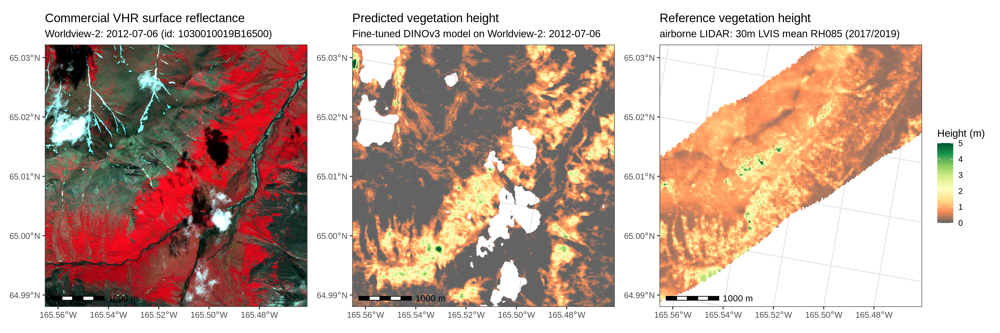

In [8]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# Custom CHM max = 20
p_good_seward_1030010019B16500_1 <- map_raster_by_catid( 
    catid = '1030010019B16500',#'103001009A81F500', # "1030010099BF2F00", 
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    # Not bad point
    # crop_center_lon = -165.49433,
    # crop_center_lat = 65.02621,
    # Better point?
    crop_center_lon = -165.52223,
    crop_center_lat = 65.01398,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)  # Crop 15% larger, display smaller

print(p_good_seward_1030010019B16500_1)


=== CHM Processing ===
Searching for catid: 1030010019B16500 in /explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m 
Using CHM file: WV02_20120706_M1BS_1030010019B16500-chm-dm-10m.tif 
CHM CRS: NAD83 / Alaska Albers 
CHM dimensions: 7965 3164 
Applying crop with buffer: 500 x 500 pixels
Display extent: -554365.2 -549365.2 1699652 1704652 
Crop extent (with buffer): -554740.2 -548990.2 1699277 1705027 
Cropped CHM dimensions: 575 575 
CHM extent: -554745, -548995, 1699275, 1705025 

=== Source Processing ===
Searching for catid: 1030010019B16500 in /explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023 
Using source file: WV02_20120706_M1BS_1030010019B16500-sr-02m.tif 
Loading source raster...
Source CRS: WGS 84 / UTM zone 3N 
Source dimensions: 38742 9572 
Source bands: 4 
Source and CHM in same CRS: FALSE 
Cropping source to buffered CHM extent...
CHM extent in source CRS: 463813.2 470429.5 7187723 7194336 
Reprojecting cropped source to CHM CR

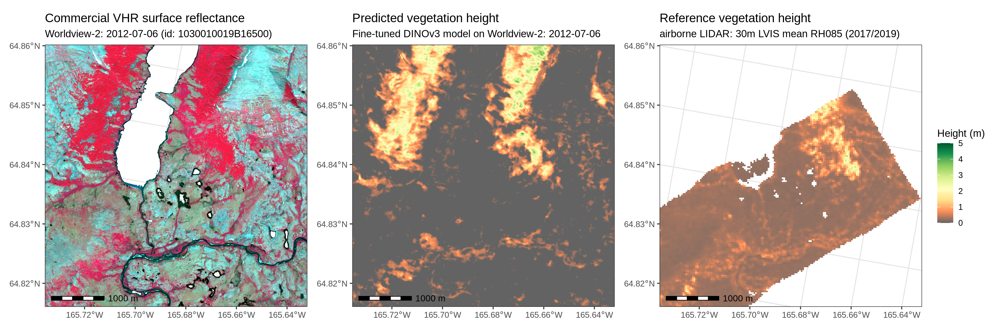

In [9]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# Custom CHM max = 20
p_good_seward_1030010019B16500 <- map_raster_by_catid( 
    catid = '1030010019B16500',#'103001009A81F500', # "1030010099BF2F00", 
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -165.69305,
    crop_center_lat = 64.84205,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)  # Crop 15% larger, display smaller

print(p_good_seward_1030010019B16500)

#### Map a good catid - example of Seward site

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# Custom CHM max = 20
p_good_seward_10300100968FB300 <- map_raster_by_catid( 
    catid = "10300100968FB300", 
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -164.8739,
    crop_center_lat = 64.938,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)  # Crop 15% larger, display smaller

print(p_good_seward_10300100968FB300)

#### Map a good catid - example of good cloud/shadow masking [NOT NEEDED]

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5, repr.plot.res = 250, warn=-1)

# Usage examples:

# Custom CHM max = 20
p_good_clouds_103001002401CD00 <- map_raster_by_catid( 
    catid = "103001002401CD00", 
    chm_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/2026_chm/4.3.2.5/dm_10m",
    source_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/srlite/002m_2023",
    val_csv_dir = "/explore/nobackup/projects/above/misc/ABoVE_Shrubs/validation/chm/dinov3/4.3.2.5/dm_10m/LVISRH075_RH085_RH098",
    lvis_grid_dir = "/explore/nobackup/people/pmontesa/userfs02/data/LVIS/2019/output/metrics/30",
      lvis_rh_str = 'RH085',
    use_forest_ht_cmap = TRUE,
    fill_label = "Height (m)",
    crop_center_lon = -154.2,
    crop_center_lat = 60.9,
    crop_width_pixels = 500,
    crop_height_pixels = 500,
                         chm_max_value = 5,
                         edge_buffer = 1.15,  # Crop 15% larger, display smaller
  SHOW_REF = TRUE,
  SCALE_FACTOR = 0.1
)  # Crop 15% larger, display smaller

print(p_good_clouds_103001002401CD00)

In [116]:
options(repr.plot.width = 15, repr.plot.height = 25, repr.plot.res = 250, warn=-1)

#p_bad_103001000C00E300 / p_good_seward_10300100968FB300 / p_good_clouds_103001002401CD00

p_combined_figure_01 = p_good_seward_1030010019B16500_1 / p_good_seward_1030010019B16500 / p_good_seward_10300100968FB300 / p_show_ref_104001004F54B700 / 
    p_show_ref_103001006E5C5200 / p_show_ref_10300100255A5800 / p_show_ref_10300100263C5F00

p_combined_figure_01

ERROR: Error in eval(expr, envir, enclos): object 'p_show_ref_103001006E5C5200' not found


In [26]:
library(leaflet)
library(sf)

# Read the footprints GeoPackage
footprints <- st_read("/explore/nobackup/projects/above/misc/ABoVE_Shrubs/footprints/footprints_chm_20231014_chm_002m.gpkg") %>%
    #filter( (month > 6) & (month < 9)) %>%
    filter(catid == '10300100256A7D00')

# Transform to WGS84 (EPSG:4326) for Leaflet
footprints_wgs84 <- st_transform(footprints, 4326)

# Create leaflet map
leaflet(footprints_wgs84) %>%
  addProviderTiles(providers$Esri.WorldGrayCanvas) %>%
  addPolygons(
    fillColor = "blue",
    fillOpacity = 0.3,
    color = "darkblue",
    weight = 2,
    popup = ~paste0("CATID: ", catid, "<br>",
                    "Sensor: ", sensor, "<br>",
                    "Date: ", date)
  ) %>%
  addScaleBar(position = "bottomleft")

Reading layer `footprints_chm_20231014_chm_002m' from data source 
  `/panfs/ccds02/nobackup/projects/above/misc/ABoVE_Shrubs/footprints/footprints_chm_20231014_chm_002m.gpkg' 
  using driver `GPKG'
Simple feature collection with 1280 features and 13 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -178.7638 ymin: 51.30279 xmax: 176.1451 ymax: 71.52065
Geodetic CRS:  WGS 84


HTML widgets cannot be represented in plain text (need html)